# Comparative Lagrangian Simulation of Marine Debris Movement

This Jupyter notebook models and simulates the movement of marine debris around the coast of Malta using the OceanParcels framework. A comparative approach is implemented to evaluate the predictions of the sea surface currents velocities dataset against the actual data from the same timeframe.

The analysis specifically focuses on data from the 4th of August 2023. Using historical data enables a detailed comparison between actual and predicted movements of marine debris, allowing for validation of the predictive models' accuracy against real data.

The notebook follows a structured process that is repeated for both actual and predicted data scenarios: importing necessary libraries, preparing datasets, setting up the simulation environment, defining custom behaviours through kernels, initializing particle positions, and executing the simulation. Finally, the results from both scenarios are compared through an overlapping visualization to illustrate the differences and similarities between actual and predicted values.

### Importing Necessary Libraries

In [1]:
from parcels import (
    AdvectionRK4,
    Field,
    FieldSet,
    JITParticle,
    ParticleSet,
    StatusCode,
    Variable,
)
import parcels.rng as ParcelsRandom
from datetime import timedelta
import math
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from rasterio.features import rasterize
import xarray as xr
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

### Suppress Future Warnings

In [2]:
import warnings

# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Loading shapefile and extracting coastline boundaries

The coastline boundaries are essential for defining the simulation area and implementing land-sea interactions. This section loads a shapefile representing Malta's coastline and visualizes the coastline. This shapefile is crucial for the creation of the land sea mask in the next step.

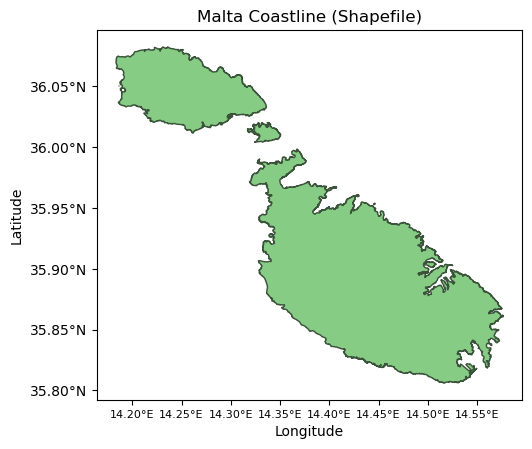

In [3]:
# Load the shapefile
shapefile_path = 'Data/land_sea_mask/MaltaCoastline.shp'
gdf = gpd.read_file(shapefile_path)

# Convert the GeoDataFrame to WGS 84 CRS (if it's not already)
gdf = gdf.to_crs(epsg=4326)

# Plot the shapefile
gdf.plot(color='#86CC85', edgecolor='#3B533B')
plt.title('Malta Coastline (Shapefile)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Format the axis labels to show degrees
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda val, pos: '{:.2f}°E'.format(val)))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda val, pos: '{:.2f}°N'.format(val)))

# Make the x-axis labels smaller
plt.gca().tick_params(axis='x', labelsize=8)  

# Display the plot
plt.show()

### Createing the Land-Sea Mask

A high-resolution land-sea mask is generated by rasterizing the coastline shapefile. This mask distinguishes between land and sea areas, allowing for accurate particle tracking near coastal regions. The mask is saved as a NetCDF file and visualized to verify its correctness. This preparation is vital for the simulation, as it influences particle behavior at the land-sea interface.

The visualization displays the land-sea mask with dark purple indicating sea areas (0) and red with a white outline denoting land areas (1).

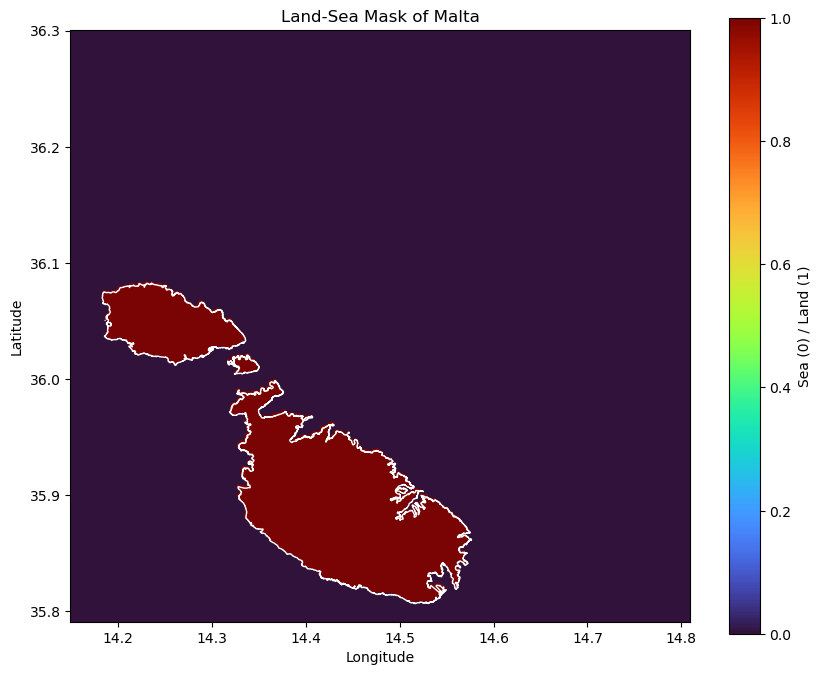

In [4]:
# Convert GeoDataFrame projection to WGS 84 for compatibility
gdf = gdf.to_crs(epsg=4326)

# Define the geographical bounds for the simulation area
lon_min, lat_min, lon_max, lat_max = 14.15, 35.79, 14.81, 36.3

# Set the resolution of the grid in kilometers (0.1 km)
resolution_km = 0.1 

# Calculate the resolution in degrees based on the latitude
mean_lat = (lat_min + lat_max) / 2  # Average latitude for the area
km_per_degree = np.cos(mean_lat * np.pi / 180) * 111.32  # Approx kilometers per degree at this latitude
resolution_degrees = resolution_km / km_per_degree  # Convert resolution from km to degrees

# Determine the number of grid cells needed based on the area's dimensions and resolution
num_lons = int(np.ceil((lon_max - lon_min) / resolution_degrees))  # Number of longitude cells
num_lats = int(np.ceil((lat_max - lat_min) / resolution_degrees))  # Number of latitude cells

# Generate transformation parameters for converting lat/lon to grid coordinates
transform = rasterio.transform.from_origin(lon_min, lat_max, resolution_degrees, resolution_degrees)

# Convert the shapefile to a raster format using the specified grid resolution
raster = rasterize(
    [(geom, 1) for geom in gdf.geometry],  # Assign a value of 1 to all shapes
    out_shape=(num_lats, num_lons),  # Shape of the output raster
    transform=transform,  # Transformation parameters
    fill=0,  # Fill value outside shapes (representing sea)
    all_touched=True  # Include all pixels touched by geometries
)

# Generate arrays of longitude and latitude values corresponding to the grid
lons = np.linspace(lon_min, lon_max, num_lons, endpoint=False)  # Longitude values
lats = np.linspace(lat_max, lat_min, num_lats, endpoint=False)[::-1]  # Latitude values 

# Create an xarray Dataset with the land-sea mask, using the generated raster grid
ds = xr.Dataset(
    {
        'land_sea_mask': (['lat', 'lon'], raster)  # Define the land-sea mask variable
    },
    coords={
        'lon': lons,  # Longitude coordinate
        'lat': lats   # Latitude coordinate
    }
)

# Save the land-sea mask dataset as a NetCDF file
nc_filename = "Data/land_sea_mask/land_sea_mask_malta.nc"
ds.to_netcdf(nc_filename)

# Plot the generated land-sea mask to visually verify its accuracy
plt.figure(figsize=(10, 8))
plt.pcolormesh(lons, lats[::-1], raster, cmap='turbo')  
# Colorbar for differentiation
plt.colorbar(label='Sea (0) / Land (1)')  
plt.title('Land-Sea Mask of Malta')  
plt.xlabel('Longitude')  
plt.ylabel('Latitude')  

# Overlay the original shapefile on the raster to check alignment
gdf.plot(ax=plt.gca(), color='none', edgecolor='white')

# Display the plot
plt.show()  

---

## 1. Actual values Lagrangian Simulation

This section prepares the dataset of the actual values, constructs a fieldset, defines custom behaviours for the simulation through kernels, initializes the particle positions , and executes the simulation. 

### Verifying the structure and dimentions of the data file

Before proceeding with the simulation, it's crucial to inspect the structure and dimensions of the datasets involved. This section opens and prints the actual values dataset for the Sea Surface Currents (SSC) velocities, providing an understanding of its structure, variables, and dimensions. It ensures that the dataset is correctly formatted and suitable for use in the simulation.

In [5]:
# Define the path to the NetCDF file containing actual Sea Surface Current data
actual_netcdf_path = "Data/Model_IO/1_day_actual_4th_SSC_Data.nc"

# Open the dataset
df_actual_values = xr.open_dataset(actual_netcdf_path)

# Convert the dataset to a pandas DataFrame and reset the index 
df_actual_values = df_actual_values.to_dataframe().reset_index()

# Display the DataFrame
df_actual_values

,time,lat,lon,u,v,stdu,stdv,cov,velo,head
0,2023-08-04 00:00:00,35.744701,13.6768,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-08-04 00:00:00,35.744701,13.7174,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2023-08-04 00:00:00,35.744701,13.7579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-08-04 00:00:00,35.744701,13.7985,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023-08-04 00:00:00,35.744701,13.8390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
53659,2023-08-04 23:00:00,36.880199,15.2182,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53660,2023-08-04 23:00:00,36.880199,15.2587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53661,2023-08-04 23:00:00,36.880199,15.2993,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53662,2023-08-04 23:00:00,36.880199,15.3398,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Creating a FieldSet

A `FieldSet` is created from the actual sea surface currents dataset. It serves as the simulation environment, defining the velocity fields that drive particle movement. The land-sea mask is also incorporated into the FieldSet as an additional field, providing the necessary data for reflecting or deleting particles upon reaching the coastline.

In [6]:
fieldset = FieldSet.from_netcdf(
    filenames={
        "U": actual_netcdf_path,  # Path to NetCDF file for actual sea surface currents (U component)
        "V": actual_netcdf_path,  # Path to NetCDF file for actual sea surface currents (V component)
    },
    variables={
        "U": "u",  # Variable name in the file for U component of actual sea surface currents
        "V": "v",  # Variable name in the file for V component of actual sea surface currents
    },
    dimensions={
        "U": {"lon": "lon", "lat": "lat", "time": "time"},  # Dimensions for U 
        "V": {"lon": "lon", "lat": "lat", "time": "time"},  # Dimensions for V 
    },
    # Allow the model to extrapolate values beyond the dataset's time range
    allow_time_extrapolation=True  
)

# Load the land-sea mask data from a NetCDF file
landsea_data_actual_values = xr.open_dataset("Data/land_sea_mask/land_sea_mask_malta.nc")

# Add the land-sea mask as a Field to the FieldSet, enabling land-sea differentiation in the simulation
fieldset.add_field(Field('land_sea_mask', 
                         data=landsea_data_actual_values['land_sea_mask'].values,
                         lon=landsea_data_actual_values['lon'].values,  
                         lat=landsea_data_actual_values['lat'].values,  
                         mesh='spherical',
                         interp_method='nearest'))  

### Custom Kernels

Custom kernels are defined to introduce specific behaviors into the simulation, modeling realistic scenarios that particles may encounter:

1. **CheckOutOfBounds**: Removes particles from the simulation if they move beyond the defined boundaries. This prevents particles from straying outside the simulation domain.

2. **CheckError**: Deletes particles encountering computational errors, specifically those with state codes above 50. This ensures the simulation proceeds without disrupted or incorrect particle data.

3. **ReflectiveParticle**: Enhances particle tracking by recording additional variables such as previous positions and elapsed time since the start of the simulation. 

4. **UpdateElapsedTime**: Increases each particle's elapsed time by the absolute value of its time step, offering a time-dependent analysis feature by showing how long a particle has been in the system.

5. **UpdatePreviousPosition**: Captures the current position of particles before they move. This is crucial for the reflection logic, ensuring accurate position tracking.

6. **ReflectOnLand**: Applies a reflection behavior when particles encounter land, as indicated by the land-sea mask, preventing them from passing through terrestrial areas. Additionally, introduces a probability that particles may 'beach' or adhere to the land, symbolizing deposition or entrapment.

In [7]:
# Custom Kernel to delete particles that move out of bounds
def CheckOutOfBounds(particle, fieldset, time):
    # Check if particle state indicates an out-of-bounds error
    if particle.state == StatusCode.ErrorOutOfBounds:
        particle.delete()  # Remove the particle from the simulation

# Custom Kernel to delete particles encountering any error state
def CheckError(particle, fieldset, time):
    # Captures all errors with state codes greater than or equal to 50
    if particle.state >= 50:  
        particle.delete()  # Remove the particle from the simulation
        
# Custom particle class with added variables for previous positions and elapsed time
class ReflectiveParticle(JITParticle):
    # Previous longitude, initialized to the first longitude of the field
    prev_lon = Variable('prev_lon', initial=fieldset.U.grid.lon[0])  
    # Previous latitude, initialized to the first latitude of the field
    prev_lat = Variable('prev_lat', initial=fieldset.U.grid.lat[0])  
    # Elapsed time since the start of the simulation in days
    elapsed_time = Variable('elapsed_time', initial=0.)  
    
# Custom Kernel to update the elapsed time of particles
def UpdateElapsedTime(particle, fieldset, time):
    # Increment elapsed_time by the absolute value of particle's dt, converted from seconds to days
    particle.elapsed_time += math.fabs(particle.dt) / (3600 * 24)
    
# Custom Kernel to update particle's previous position before it moves
def UpdatePreviousPosition(particle, fieldset, time):
    # Store current position as previous position for reflection logic
    particle.prev_lon = particle.lon
    particle.prev_lat = particle.lat
    
# Kernel to reflect particles upon hitting land
def ReflectOnLand(particle, fieldset, time):
    # Check if particle is on land using the land-sea mask
    if fieldset.land_sea_mask[particle] == 1:
        # Generate a random number to decide on beaching or reflection
        random_number = ParcelsRandom.random()
        beaching_probability = 0.15  # 15% chance to be beach

        if random_number <= beaching_probability:
            # Delete the particle if it beaches
            particle.delete()
        else:
            # Reflect the particle by reverting to its previous position
            particle.lon = particle.prev_lon
            particle.lat = particle.prev_lat

### Initializing the Particles

In this section, particles are initialized near a specified location with random offsets to simulate a dispersed release. A random seed is employed to ensure that the initialization locations for both actual and predicted values are identical, enhancing the accuracy and comparability of the simulations. This uniform initialization allows for a direct comparison between the trajectories of actual and predicted particle movements. The section also plots the initial positions of these particles on the map, to show where they will be initialised exactly. The particles represent the objects of interest, such as sea surface debris, whose movements are to be simulated.

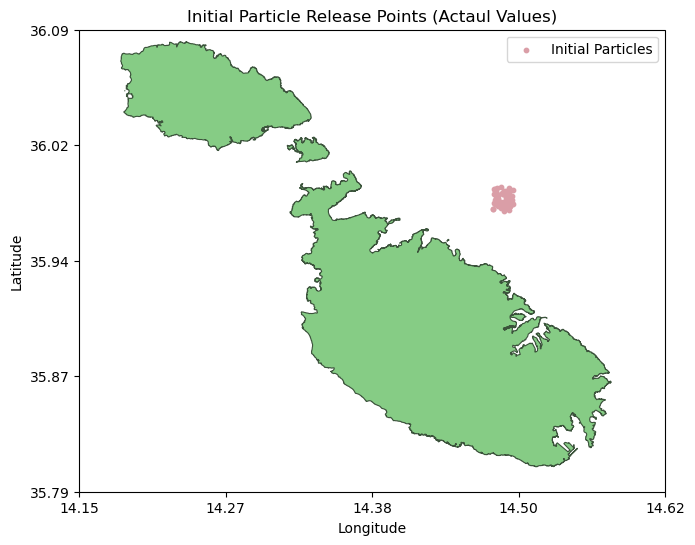

In [8]:
# Set a random seed for reproducibility
np.random.seed(99)

# Number of particles to simulate
num_particles = 50

# Geographic coordinates for the starting point of all particles
start_lat = 35.98
start_lon = 14.49

# Range for generating random offsets for the particles
offset_range = 0.008  

# Generate random offsets for longitude and latitude to simulate initial dispersion
lon_offsets = np.random.uniform(-offset_range, offset_range, num_particles)
lat_offsets = np.random.uniform(-offset_range, offset_range, num_particles)

# Apply these offsets to the starting point to get initial positions
lon_release_actual = start_lon + lon_offsets
lat_release_actual = start_lat + lat_offsets

# Define the geographic boundaries for plotting
extent = [14.15, 14.62, 35.79, 36.09]

# Prepare the plot with a geographic (Plate Carree) projection
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent(extent)

# Plot the coastline of Malta from a shapefile using GeoPandas
gdf.plot(ax=ax, color='#86CC85', edgecolor='#3B533B', linewidth=0.8, zorder=2)

# Plot the initial positions of the particles on the map
scatter = ax.scatter(lon_release_actual, lat_release_actual, s=10, c='#DA9EA7', marker='o', transform=ccrs.PlateCarree(), label='Initial Particles')

# Define and set ticks for longitude and latitude to improve map readability
lon_ticks = np.linspace(extent[0], extent[1], num=5) 
lat_ticks = np.linspace(extent[2], extent[3], num=5) 
ax.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
ax.set_yticks(lat_ticks, crs=ccrs.PlateCarree())
ax.set_xticklabels([f'{tick:.2f}' for tick in lon_ticks])
ax.set_yticklabels([f'{tick:.2f}' for tick in lat_ticks])

# Add additional plot elements 
plt.title("Initial Particle Release Points (Actaul Values)")
plt.xlabel('Longitude')  
plt.ylabel('Latitude')  
plt.legend()  

# Display the plot
plt.show()  

### Executing the simulation for the Actual Values

In this section, the duration and frequency of the simulation are established by defining the runtime and timestep. These settings influence how long the simulation runs and how often the particles' positions are updated. The ParticleSet is initialized with the actual values using the ReflectiveParticle class. Following initialization, the simulation is executed using the custom kernels. The resulting simulation data is then saved. 

In [9]:
# Define the total duration of the simulation
runtime_actual_values = timedelta(days=1)  

# Set the time step for the simulation
dt_actual_values = timedelta(minutes=10) 

# Initialize a ParticleSet for the actual values using the ReflectiveParticle class
pset = ParticleSet(fieldset=fieldset, pclass=ReflectiveParticle, lon=lon_release_actual, lat=lat_release_actual)

# Path where simulation will be saved
actual_zarr_path = "Lagrangian_Output/GRU_actual_values.zarr"

# Define output file for the simulation data (particle data is saved every 10 minutes)
output_file = pset.ParticleFile(name = actual_zarr_path, outputdt=timedelta(minutes=10))

# Execute the simulation with the defined kernels and simulation parameters
pset.execute(
    AdvectionRK4 +  # Advection kernel using 4th order Runge-Kutta method
    pset.Kernel(UpdatePreviousPosition) +  # Custom kernel to update previous positions
    pset.Kernel(ReflectOnLand) +  # Custom kernel to handle reflection or beaching on land
    pset.Kernel(UpdateElapsedTime) +  # Custom kernel to update elapsed time
    pset.Kernel(CheckOutOfBounds) +  # Custom kernel to check for and handle out-of-bounds particles
    pset.Kernel(CheckError),  # Custom kernel to check for and handle errors
    runtime=runtime_actual_values,  # Duration of the simulation
    dt=dt_actual_values,  # Time step for the simulation
    output_file=output_file,  # Output file for storing particle data
)  

print("="*175)

INFO: Output files are stored in Lagrangian_Output/GRU_actual_values.zarr.
100%|██████████| 86400.0/86400.0 [00:45<00:00, 1917.77it/s]


---

## 2. Predicted values Lagrangian Simulation

In this section, predictions for 'u' and 'v' velocity components from GRU models are merged and used to prepare the dataset, next, a distinct fieldset for the predicted values is created. The process continues with the initialization of particle positions, followed by executing the simulation.

### Merging 'u' and 'v' predictions into a single NetCDF file

In [10]:
# Load 'u' predictions
u_predictions_path = "Data/model_IO/GRU/GRU_merged_predictions_u.csv"
u_predictions_df = pd.read_csv(u_predictions_path)
print("="*175)
print("\nLoaded 'u' predictions:")
# Show the first few rows to check the data
print(u_predictions_df.head())
print("\n"+"="*175)  

# Load 'v' predictions
v_predictions_path = "Data/model_IO/GRU/GRU_merged_predictions_v.csv"
v_predictions_df = pd.read_csv(v_predictions_path)
print("\nLoaded 'v' predictions:")
# Show the first few rows to check the data
print(v_predictions_df.head())  
print("\n"+"="*175)  

# Merge the two dataframes on 'time', 'lat', and 'lon' columns
merged_predictions_df = pd.merge(u_predictions_df, v_predictions_df, on=['time', 'lat', 'lon'], suffixes=('_u', '_v'))
print("\nMerged predictions:")
# Show the first few rows of the merged DataFrame
print(merged_predictions_df.head())  
print("\n"+"="*175)  

# Check if any rows have missing data after merging
missing_data_check = merged_predictions_df.isnull().sum()
print("\nMissing data check after merging:")
print(missing_data_check.to_string())
print("\n"+"="*175)  

# Convert the 'time' column from string to datetime format and set as index
merged_predictions_df['time'] = pd.to_datetime(merged_predictions_df['time'])

# Before converting to NetCDF, save the merged DataFrame to a new CSV file
csv_output_path = "Data/model_IO/GRU/GRU_merged_predictions_final.csv"
merged_predictions_df.to_csv(csv_output_path, index=False)
print(f"\nSaved merged predictions to CSV file '{csv_output_path}'")
print("\n"+"="*175)  

# Set ['time', 'lat', 'lon'] as the multi-level index for the xarray Dataset
xr_dataset = xr.Dataset.from_dataframe(merged_predictions_df.set_index(['time', 'lat', 'lon']))

# Convert the xarray Dataset to NetCDF format
prediction_netcdf_path = "Data/model_IO/GRU/GRU_merged_predictions.nc"
xr_dataset.to_netcdf(prediction_netcdf_path)
print(f"\nSaved merged predictions to NetCDF file '{prediction_netcdf_path}'")
print("\n"+"="*175)  


Loaded 'u' predictions:
                  time      lat      lon         u
0  2023-08-04 00:00:00  35.9006  14.5692  0.040770
1  2023-08-04 01:00:00  35.9006  14.5692  0.054441
2  2023-08-04 02:00:00  35.9006  14.5692  0.058124
3  2023-08-04 03:00:00  35.9006  14.5692  0.058573
4  2023-08-04 04:00:00  35.9006  14.5692  0.056151


Loaded 'v' predictions:
                  time      lat      lon         v
0  2023-08-04 00:00:00  35.9006  14.5692 -0.043264
1  2023-08-04 01:00:00  35.9006  14.5692 -0.067792
2  2023-08-04 02:00:00  35.9006  14.5692 -0.076773
3  2023-08-04 03:00:00  35.9006  14.5692 -0.071829
4  2023-08-04 04:00:00  35.9006  14.5692 -0.058674


Merged predictions:
                  time      lat      lon         u         v
0  2023-08-04 00:00:00  35.9006  14.5692  0.040770 -0.043264
1  2023-08-04 01:00:00  35.9006  14.5692  0.054441 -0.067792
2  2023-08-04 02:00:00  35.9006  14.5692  0.058124 -0.076773
3  2023-08-04 03:00:00  35.9006  14.5692  0.058573 -0.071829
4  2023-08

### Verifying the structure and dimentions of the data files

Before proceeding with the simulation, it's crucial to inspect the structure and dimensions of the dataset. This section opens and prints the merged predictions dataset for the Sea Surface Current (SSC) velocities, providing an understanding of its structure, variables, and dimensions. It ensures that the dataset is correctly formatted and suitable for use in the simulation.

In [11]:
# Open the predicted SSC dataset
df_predicted_values = xr.open_dataset(prediction_netcdf_path)

# Convert the dataset to a pandas DataFrame and reset the index 
df_predicted_values = df_predicted_values.to_dataframe().reset_index()

# Display the DataFrame
df_predicted_values

,time,lat,lon,u,v
0,2023-08-04 00:00:00,35.900600,14.3664,NaN,NaN
1,2023-08-04 00:00:00,35.900600,14.4069,NaN,NaN
2,2023-08-04 00:00:00,35.900600,14.4475,NaN,NaN
3,2023-08-04 00:00:00,35.900600,14.4880,NaN,NaN
4,2023-08-04 00:00:00,35.900600,14.5286,NaN,NaN
...,...,...,...,...,...
1291,2023-08-04 23:00:00,36.078701,14.4069,0.059780,-0.071218
1292,2023-08-04 23:00:00,36.078701,14.4475,0.125840,-0.020820
1293,2023-08-04 23:00:00,36.078701,14.4880,0.101535,-0.066790
1294,2023-08-04 23:00:00,36.078701,14.5286,-0.096561,-0.082977


### Creating a FieldSet

A new `FieldSet` is created from the predicted sea surface currents dataset. It serves as the simulation environment, defining the velocity fields that drive particle movement. The land-sea mask is also incorporated into the FieldSet as an additional field, providing the necessary data for reflecting or deleting particles upon reaching the coastline.

In [12]:
fieldset = FieldSet.from_netcdf(
    filenames={
        "U": prediction_netcdf_path,  # Path to NetCDF file for predicted sea surface currents (U component)
        "V": prediction_netcdf_path,  # Path to NetCDF file for predicted sea surface currents (V component)
    },
    variables={
        "U": "u",  # Variable name in the file for U component of predicted sea surface currents
        "V": "v",  # Variable name in the file for V component of predicted sea surface currents
    },
    dimensions={
        "U": {"lon": "lon", "lat": "lat", "time": "time"},  # Dimensions for U 
        "V": {"lon": "lon", "lat": "lat", "time": "time"},  # Dimensions for V
    },
    # Allow the model to extrapolate values beyond the dataset's time range
    allow_time_extrapolation=True  
)

# Load the land-sea mask data from a NetCDF file
landsea_data_predicted_values = xr.open_dataset("Data/land_sea_mask/land_sea_mask_malta.nc")

# Add the land-sea mask as a Field to the FieldSet, enabling land-sea differentiation in the simulation
fieldset.add_field(Field('land_sea_mask', 
                         data=landsea_data_predicted_values['land_sea_mask'].values,
                         lon=landsea_data_predicted_values['lon'].values,  
                         lat=landsea_data_predicted_values['lat'].values,  
                         mesh='spherical',
                         interp_method='nearest'))  

### Initializing the Particles

Similar to before, particles are initialized near a specified location with random offsets to simulate a dispersed release. The same random seed is employed to ensure that the initialization locations for both actual and predicted values are identical, enhancing the accuracy and comparability of the simulations. This uniform initialization allows for a direct comparison between the trajectories of actual and predicted particle movements. The section also plots the initial positions of these particles on the map, to show where they will be initialised exactly. The particles represent the objects of interest, such as sea surface debris, whose movements are to be simulated.

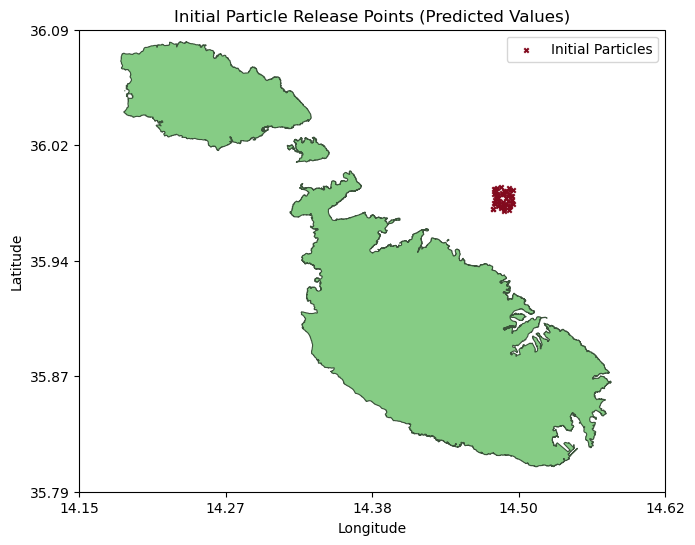

In [13]:
# Use the same number as in the 'actual' simulation
np.random.seed(99)  

# Number of particles to simulate remains the same
num_particles = 50

# Geographic coordinates for the starting point of all particles
start_lat = 35.98
start_lon = 14.49

# The range for generating random offsets remains the same
offset_range = 0.008  

# Generate random offsets for longitude and latitude to simulate initial dispersion
# Since the random seed is the same, these will match the 'actual' offsets
lon_offsets = np.random.uniform(-offset_range, offset_range, num_particles)
lat_offsets = np.random.uniform(-offset_range, offset_range, num_particles)

# Apply these offsets to the starting point to get initial positions
lon_release_predicted = start_lon + lon_offsets
lat_release_predicted = start_lat + lat_offsets

# Prepare the plot with a geographic (Plate Carree) projection
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent(extent)

# Plot the coastline of Malta from a shapefile using GeoPandas
gdf.plot(ax=ax, color='#86CC85', edgecolor='#3B533B', linewidth=0.8, zorder=2)

# Plot the initial positions of the particles on the map
scatter = ax.scatter(lon_release_predicted, lat_release_predicted, s=10, c="#820A1E", marker='x', transform=ccrs.PlateCarree(), label='Initial Particles')

# Define and set ticks for longitude and latitude to improve map readability
lon_ticks = np.linspace(extent[0], extent[1], num=5) 
lat_ticks = np.linspace(extent[2], extent[3], num=5) 
ax.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
ax.set_yticks(lat_ticks, crs=ccrs.PlateCarree())
ax.set_xticklabels([f'{tick:.2f}' for tick in lon_ticks])
ax.set_yticklabels([f'{tick:.2f}' for tick in lat_ticks])

# Add additional plot elements 
plt.title("Initial Particle Release Points (Predicted Values)")
plt.xlabel('Longitude')  
plt.ylabel('Latitude')  
plt.legend()  

# Display the plot
plt.show() 

### Executing the simulation for the Predicted Values

In this section, the duration and frequency of the simulation are established by defining the runtime and timestep. These settings influence how long the simulation runs and how often the particles' positions are updated. The ParticleSet is initialized with the predicted values using the ReflectiveParticle class. Following initialization, the simulation is executed using the custom kernels. The resulting simulation data is then saved. 

In [14]:
# Define the total duration of the simulation
runtime_predicted_values = timedelta(days=1)  

# Set the time step for the simulation
dt_actual_values = timedelta(minutes=10) 

# Initialize a ParticleSet for the predicted values using the ReflectiveParticle class
pset = ParticleSet(fieldset=fieldset, pclass=ReflectiveParticle, lon=lon_release_predicted, lat=lat_release_predicted)

# Path where simulation will be saved
predicted_zarr_path = "Lagrangian_Output/GRU_predicted_values.zarr"

# Define output file for the simulation data (particle data is saved every 10 minutes)
output_file = pset.ParticleFile(name = predicted_zarr_path, outputdt=timedelta(minutes=10))

# Execute the simulation with the defined kernels and simulation parameters
pset.execute(
    AdvectionRK4 +  # Advection kernel using 4th order Runge-Kutta method
    pset.Kernel(UpdatePreviousPosition) +  # Custom kernel to update previous positions
    pset.Kernel(ReflectOnLand) +  # Custom kernel to handle reflection or beaching on land
    pset.Kernel(UpdateElapsedTime) +  # Custom kernel to update elapsed time
    pset.Kernel(CheckOutOfBounds) +  # Custom kernel to check for and handle out-of-bounds particles
    pset.Kernel(CheckError),  # Custom kernel to check for and handle errors
    runtime=runtime_predicted_values,  # Duration of the simulation
    dt=dt_actual_values,  # Time step for the simulation
    output_file=output_file,  # Output file for storing particle data
)  

print("="*175)

INFO: Output files are stored in Lagrangian_Output/GRU_predicted_values.zarr.
100%|██████████| 86400.0/86400.0 [00:57<00:00, 1499.50it/s]


---

## 3. Overlapping Visualisation

The final stage of this notebook presents an overlapping visualization of particle trajectories derived from both actual and predicted datasets. This comparative display allows for a direct visual assessment of the predictive model's accuracy in simulating marine debris movement under real-world conditions. In this section, datasets representing actual and predicted particle movements are loaded and plotted against the geographical backdrop of Malta's coastline. The visualization highlights the trajectories of marine debris as influenced by sea surface currents, allowing for a comparison between actual values and model predictions.

In [15]:
# Load actual particle data
actual_ds = xr.open_zarr("Lagrangian_Output/GRU_actual_values.zarr")

# Load predicted particle data
predicted_ds = xr.open_zarr("Lagrangian_Output/GRU_predicted_values.zarr")

# Define the geographic boundaries for the plot
extent_visualisation = [14.15, 14.62, 35.79, 36.09]

# Disable interactive plotting to facilitate animation creation
plt.ioff()

# Initialize the plot with a specific size and PlateCarree projection
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent(extent_visualisation)

# Load and reproject the shapefile containing Malta's coastline to WGS 84
malta_map = gpd.read_file('Data/land_sea_mask/MaltaCoastline.shp')
malta_map = malta_map.to_crs(epsg=4326)

# Plot Malta's map with specified colors and border lines
malta_map.plot(ax=ax, color='#86CC85', edgecolor='#3B533B', linewidth=0.8, zorder=2)

# Enhance the map with borders for context
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Set custom tick labels for longitude and latitude
lon_ticks = np.linspace(extent_visualisation[0], extent_visualisation[1], 5)
lat_ticks = np.linspace(extent_visualisation[2], extent_visualisation[3], 5)
ax.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
ax.set_yticks(lat_ticks, crs=ccrs.PlateCarree())
ax.set_xticklabels([f"{lon:.2f}" for lon in lon_ticks])
ax.set_yticklabels([f"{lat:.2f}" for lat in lat_ticks])

# Add labels to the axes
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Set title
ax.set_title('GRU Actual vs Predicted Particle Trajectories (24 hrs)', fontsize=14)

# Initialize scatter plots for actual and predicted particles
actual_scatter = ax.scatter([], [], s=20, c='#DA9EA7', marker='o', transform=ccrs.PlateCarree(), label='Actual Particles')
predicted_scatter = ax.scatter([], [], s=20, c='#820A1E', marker='x', transform=ccrs.PlateCarree(), label='Predicted Particles')

# Add legend
ax.legend(loc='upper right')

# Define animation update function
def update(frame):
    # Update actual particles
    actual_data = actual_ds.isel(obs=frame)
    actual_scatter.set_offsets(np.vstack((actual_data.lon.values, actual_data.lat.values)).T)
    
    # Update predicted particles
    predicted_data = predicted_ds.isel(obs=frame)
    predicted_scatter.set_offsets(np.vstack((predicted_data.lon.values, predicted_data.lat.values)).T)
    
    return actual_scatter, predicted_scatter

# Total frames for the animation
total_frames = max(actual_ds.dims['obs'], predicted_ds.dims['obs'])

# Create animation
ani = FuncAnimation(fig, update, frames=total_frames, interval=100, blit=False)

# Save the animation
ani.save('Lagrangian_Output/GRU_combined_particle_trajectories.gif', writer='pillow', dpi=80)

# Display the animation
HTML(ani.to_jshtml())

---